## MuSpAn: Figure 5. Quantification of tissue scale features

In this notebook we will reproduce analysis that is used to generate Figure 5 from MuSpAn: A Toolbox for Multiscale Spatial Analysis. This figure focues on analysis at the tissue scale using a spatial transcriptomics sample of healthy mouse colon. See reference paper for details,  https://doi.org/10.1101/2024.12.06.627195.

NOTE: to run this tutorial, you'll need to download the MuSpAn domains from https://github.com/joshwillmoore1/Supporting_material_muspan_paper

In [15]:
# imports for analysis
import muspan as ms 
import numpy as np
import networkx as nx # additional package - for making custom plot 
import pandas as pd # for interaction with dataframes in sns plots

# imports to make plots pretty
import seaborn as sns
sns.set_theme(style='white',font_scale=2)
sns.set_style('ticks')
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager as fm
mpl.rcParams['figure.dpi'] = 150 # set the resolution of the figure

np.random.seed(42) # Fixed seed for reproducibility

For reproducibility we use the io save-load functionality of muspan to load a premade domain of the sample.

In [3]:
path_to_domains_folder='some/path/to/downloaded_folder/domains_for_figs_2_to_6/' # EDIT THIS PATH TO WHERE THE DOMAIN FILES ARE STORED AFTER DOWNLOADING THEM
domain_path=path_to_domains_folder+'fig-5-domain.muspan'
domain_4=ms.io.load_domain(path_to_domain=domain_path,print_metadata=True)

MuSpAn domain loaded successfully. Domain summary:
Domain name: whole_tissue_mouse
Number of objects: 126147
Collections: ['Cell centroids']
Labels: ['Cell ID', 'Transcript Counts', 'Cell Area', 'Cluster ID', 'Nucleus Area'] 
Networks: [] 
Distance matrices: []
version saved with: 1.0.0
Data and time of save: 2024-11-18 16:34:49.787773
Notes: A selected ROI from a sample of healthy colon tissue from a 10x Xenium dataset provided in the public resources repository. The domain contains cell boundaries, nuclei and a selection of transcripts: Mylk, Myl9, Cnn1, Mgll, Mustn1, Oit1, Cldn2, Nupr1, Sox9, Ccl9. The dataset also contains cell clustering labels produced by Xenium Onboard Analysis using the ‘Graph-based’ method. This dataset is licensed under the Creative Commons Attribution license.


In [5]:
# Define the order of cluster IDs
cluster_id_order = [
    'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5', 'Cluster 6', 
    'Cluster 7', 'Cluster 8', 'Cluster 9', 'Cluster 10', 'Cluster 11', 'Cluster 12', 
    'Cluster 13', 'Cluster 14', 'Cluster 15', 'Cluster 16', 'Cluster 17', 'Cluster 18', 
    'Cluster 19', 'Cluster 20', 'Cluster 21', 'Cluster 22', 'Cluster 23', 'Cluster 24', 
    'Cluster 25', 'Unassigned'
]

# Initialize an empty list to store colors
cell_colors = []

# Assign colors to clusters for consistency
for i in range(len(cluster_id_order)):
    if i < 10:
        cell_colors.append(sns.color_palette('tab20')[(2 * i) % 20])
    else:
        cell_colors.append(sns.color_palette('tab20')[(2 * (i) - 10 + 1) % 20])

# Create a dictionary to map cluster IDs to their respective colors
new_colors = {j: cell_colors[cluster_id_order.index(j)] for j in domain_4.labels['Cluster ID']['categories']}

# Update the colors in the domain object
domain_4.update_colors(new_colors, colors_to_update='labels', label_name='Cluster ID')

(<Figure size 1500x3000 with 1 Axes>, <Axes: >)

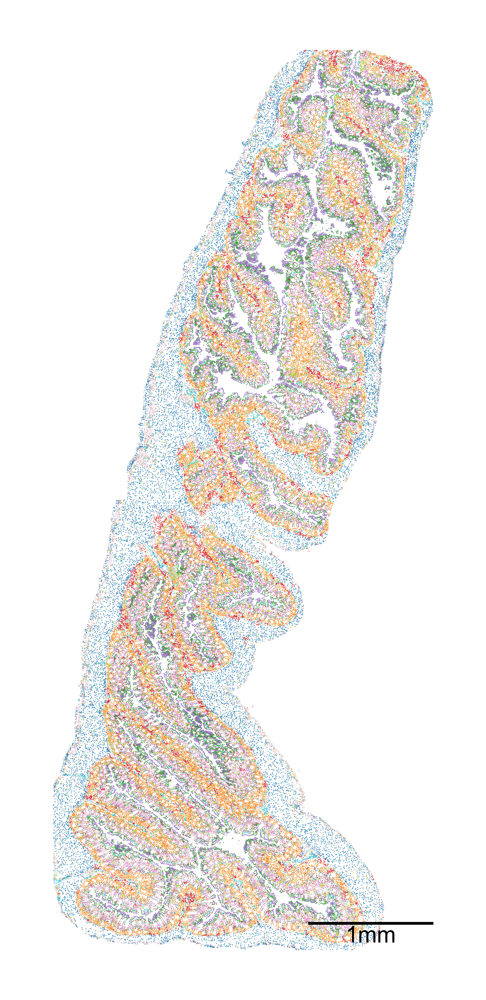

In [6]:
# Create a figure and axis for the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 20))

# Visualize the domain with specific settings
ms.visualise.visualise(
    domain_4,
    color_by=('label', 'Cluster ID'),  # Color by cluster ID
    ax=ax,
    marker_size=1.5,  # Set marker size
    scatter_kwargs=dict(linewidth=0, edgecolor=None),  # Scatter plot settings
    shape_kwargs=dict(alpha=0.2, linewidth=0.1),  # Shape settings
    add_cbar=False,  # Do not add color bar
    add_scalebar=True,  # Add scale bar
    scalebar_kwargs=dict(
        size=1000,  # Set scale bar size
        label='1mm',  # Label for the scale bar
        loc='lower right',  # Location of the scale bar
        pad=2,  # Padding
        color='black',  # Color of the scale bar
        zorder=100,  # Z-order
        size_vertical=15,  # Vertical size
        frameon=False,  # No frame
        fontproperties=fm.FontProperties(size=32)  # Font properties
    )
)

### Microenvironment analysis

Note 1: clustering neighbourhoods can be conducted in muspan using the ms.networks.cluster_neighbourhoods(...) function. This reduces this entire section into a single line of code. We explicity run through each step in the clustering process here to visualise the outputs at intermediate stages.

Note 2: this is a large domain and the ME analysis may take some time to compute (~3min on M2 chip).

In [7]:
# Generate a network using the Delaunay triangulation method
G = ms.networks.generate_network(
    domain_4,
    network_name='centroid_delaunay',
    objects_as_nodes=('collection', 'Cell centroids'),
    network_type='Delaunay',
    distance_weighted=True,
    min_edge_distance=0,
    max_edge_distance=30
)

In [8]:
# Generate k-hop neighborhoods for the domain using the Delaunay triangulation network
# k=3 specifies that we are considering neighborhoods up to 3 hops away

khop_neighbourhoods_prox = ms.networks.khop_neighbourhood(
    domain_4, 
    network_name='centroid_delaunay', 
    source_objects=None, 
    k=3
)

# The resulting dictionary `khop_neighbourhoods_prox` contains the k-hop neighborhoods for each node in the network

In [9]:
# Extract labels and object indices for 'Cluster ID'
labels, object_indices_labels = ms.query.get_labels(domain_4, 'Cluster ID')

# Get unique labels from the domain
unique_labels = domain_4.labels['Cluster ID']['categories']

# Initialize an array to store vectorized counts
vectorised_counts = np.zeros((len(khop_neighbourhoods_prox), len(unique_labels)))

# Iterate over each k-hop neighborhood
for k, id in enumerate(khop_neighbourhoods_prox.keys()):
    # Find the intersection of object indices and k-hop neighborhood indices
    _, object_indices_labels_indx, _ = np.intersect1d(object_indices_labels, khop_neighbourhoods_prox[id], return_indices=True)
    
    # Get the labels for the intersected indices
    labels_new = labels[object_indices_labels_indx]
    
    # Initialize an array to store counts of unique labels
    counts = np.zeros(len(unique_labels))
    
    # Count occurrences of each unique label in the neighborhood
    for i, ul in enumerate(unique_labels):
        counts[i] = np.sum(labels_new == ul)
    
    # Apply square root transform to reduce the effect of large counts
    vectorised_counts[k, :] = np.sqrt(counts)

In [10]:
# Perform clustering on the vectorized counts using KMeans
khop_counts_kcluster = ms.helpers.cluster_data(
    vectorised_counts,  # Data to cluster
    method='KMeans',  # Clustering method
    n_clusters=5,  # Number of clusters
    random_state=0,  # Random state for reproducibility
    n_init="auto"  # Number of initializations to perform
)

# Add the resulting cluster labels to the domain object
domain_4.add_labels(
    label_name='ME ID',  # Name of the new label
    labels=khop_counts_kcluster.labels_,  # Cluster labels
    add_labels_to=('collection', 'Cell centroids'),  # Where to add the labels
    label_type='categorical',  # Type of the label
    cmap='Dark2'  # Colormap for the labels
)

(<Figure size 1500x3000 with 1 Axes>, <Axes: >)

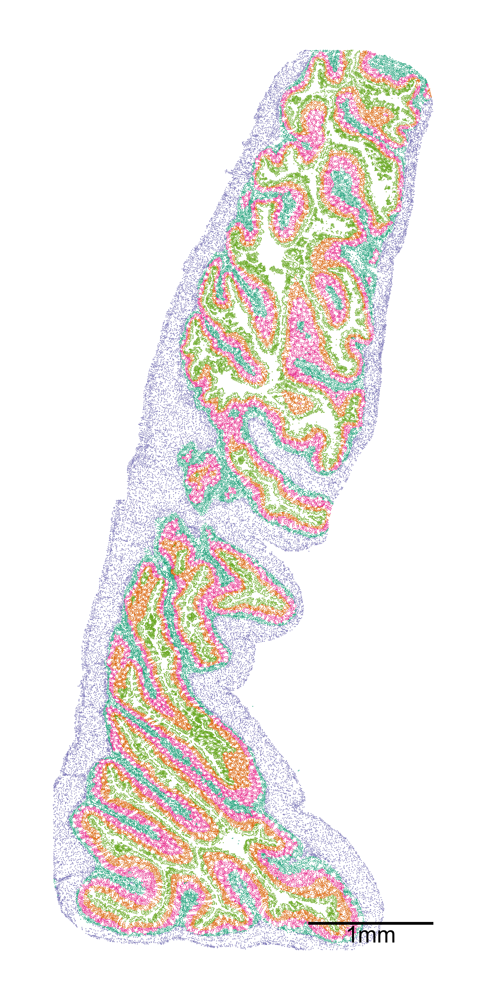

In [11]:
# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 20), nrows=1, ncols=1)

# Visualize the domain with the new 'ME ID' labels
ms.visualise.visualise(
    domain_4,
    color_by=('label', 'ME ID'),  # Color by the new 'ME ID' labels
    ax=ax,
    marker_size=1.5,  # Set marker size
    scatter_kwargs=dict(linewidth=0, edgecolor=None),  # Scatter plot settings
    shape_kwargs=dict(alpha=0.2, linewidth=0.1),  # Shape settings
    add_cbar=False,  # Do not add color bar
    add_scalebar=True,  # Add scale bar
    scalebar_kwargs=dict(
        size=1000,  # Set scale bar size
        label='1mm',  # Label for the scale bar
        loc='lower right',  # Location of the scale bar
        pad=2,  # Padding
        color='black',  # Color of the scale bar
        zorder=100,  # Z-order
        size_vertical=15,  # Vertical size
        frameon=False,  # No frame
        fontproperties=fm.FontProperties(size=32)  # Font properties
    )
)

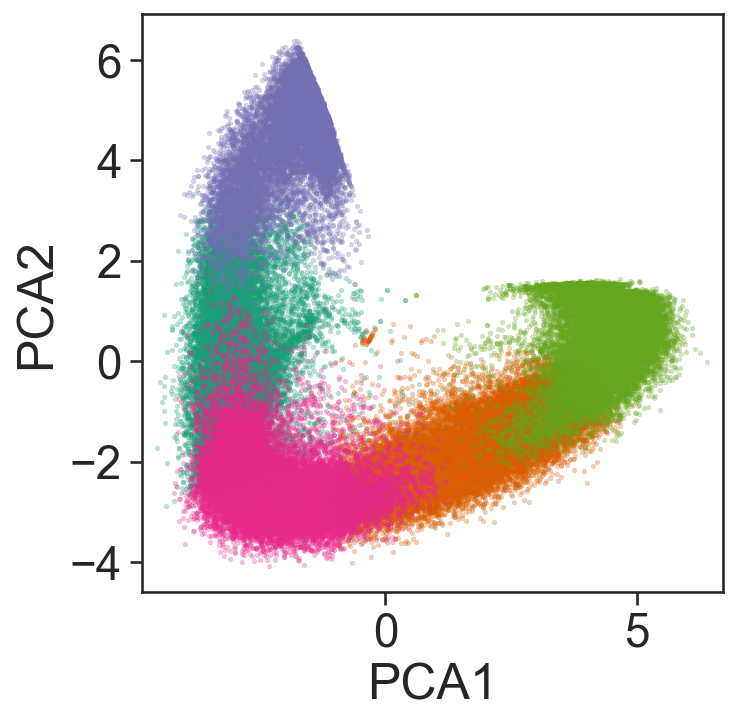

In [12]:
## This is purely for visualisation purposes

# Import necessary libraries
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Perform PCA to reduce the dimensionality of the vectorised counts to 2 components
pca = PCA(n_components=2)
pca_embedding = pca.fit_transform(vectorised_counts)

# Extract the cluster labels from the k-hop counts clustering result
proximity_cluster_labels = khop_counts_kcluster.labels_

# Get the unique cluster labels to plot
unique_labels_to_plot = np.unique(proximity_cluster_labels)

# Plot the PCA embedding
fig, ax = plt.subplots(figsize=(5, 5))

# Define colors for each unique label
colors = sns.color_palette('Dark2', n_colors=len(unique_labels_to_plot))

# Plot each cluster in the PCA embedding
for j, i in enumerate(unique_labels_to_plot):
    sns.scatterplot(
        x=pca_embedding[proximity_cluster_labels == i, 0], 
        y=pca_embedding[proximity_cluster_labels == i, 1], 
        s=5, 
        color=colors[j], 
        alpha=0.3, 
        edgecolors=None, 
        ax=ax
    )

# Set the labels for the axes
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')

# Ensure the aspect ratio is equal
ax.axis('equal')

# Display the plot
plt.show()


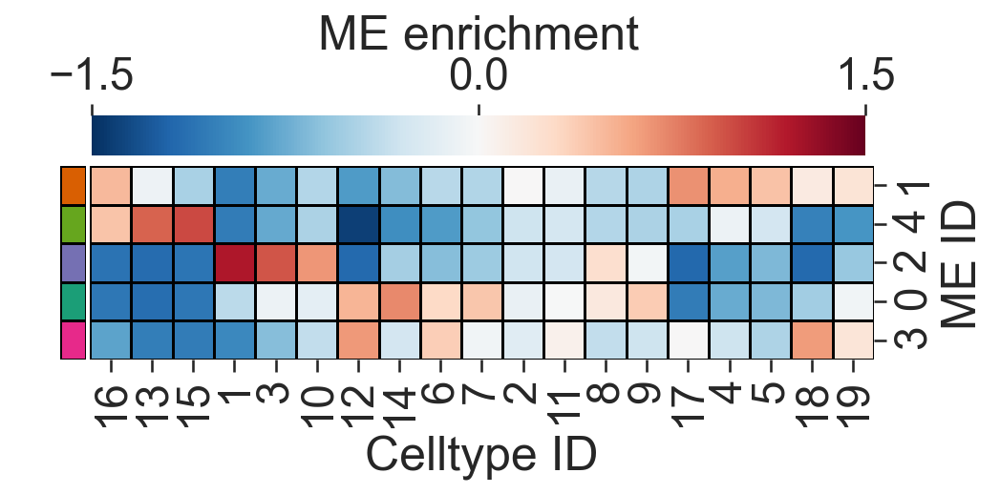

In [13]:
# Import necessary library
import pandas as pd

# Compute the mean of the vectorised counts across all samples
vectorised_counts_mean = np.mean(vectorised_counts, axis=0)

# Initialize a matrix to store the log fold change for each cluster
ME_id_matrix = np.zeros((len(unique_labels_to_plot), len(vectorised_counts_mean)))

# Set a small constant to avoid division by zero
alpha = 0.5

# Initialize a list to store colors for each cluster
row_colors = []

# Compute the log fold change matrix for differential enrichment
for j, i in enumerate(unique_labels_to_plot):
    # Calculate the log fold change for each cluster
    ME_id_matrix[j, :] = np.mean(np.log((vectorised_counts[proximity_cluster_labels == i, :] + alpha) / (vectorised_counts_mean + alpha)), axis=0)
    # Append the corresponding color for the cluster
    row_colors.append(colors[j])

# Define the clusters of interest
ClustersOfInterest = [
    'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5', 
    'Cluster 6', 'Cluster 7', 'Cluster 8', 'Cluster 9', 'Cluster 10', 
    'Cluster 11', 'Cluster 12', 'Cluster 13', 'Cluster 14', 'Cluster 15', 
    'Cluster 16', 'Cluster 17', 'Cluster 18', 'Cluster 19'
]

# Extract numeric labels from the cluster names
numeric_label_categories = [lab[8:] for lab in ClustersOfInterest]

# Create a mask to filter the clusters of interest
mask = np.zeros(len(unique_labels))
for c in ClustersOfInterest:
    mask[np.where(unique_labels == c)[0][0]] = 1

# Filter the ME_id_matrix to include only the clusters of interest
ME_id_matrix = ME_id_matrix[:, mask == 1]

# Create a DataFrame for the clustermap
df_ME_id = pd.DataFrame(data=ME_id_matrix, index=unique_labels_to_plot, columns=ClustersOfInterest)
df_ME_id.index.name = 'ME ID'
df_ME_id.columns.name = 'Celltype ID'

# Plot the clustermap
sns.clustermap(
    df_ME_id,
    xticklabels=numeric_label_categories,
    yticklabels=unique_labels_to_plot,
    figsize=(7.5, 3.5),
    cmap='RdBu_r',
    dendrogram_ratio=(.05, .3),
    col_cluster=True,
    row_cluster=True,
    square=True,
    row_colors=row_colors,
    linewidths=0.5,
    linecolor='black',
    cbar_kws=dict(use_gridspec=False, location="top", label='ME enrichment', ticks=[-1.5, 0, 1.5]),
    cbar_pos=(0.12, 0.75, 0.72, 0.08),
    vmin=-1.5,
    vmax=1.5,
    tree_kws={'linewidths': 0, 'color': 'white'}
)

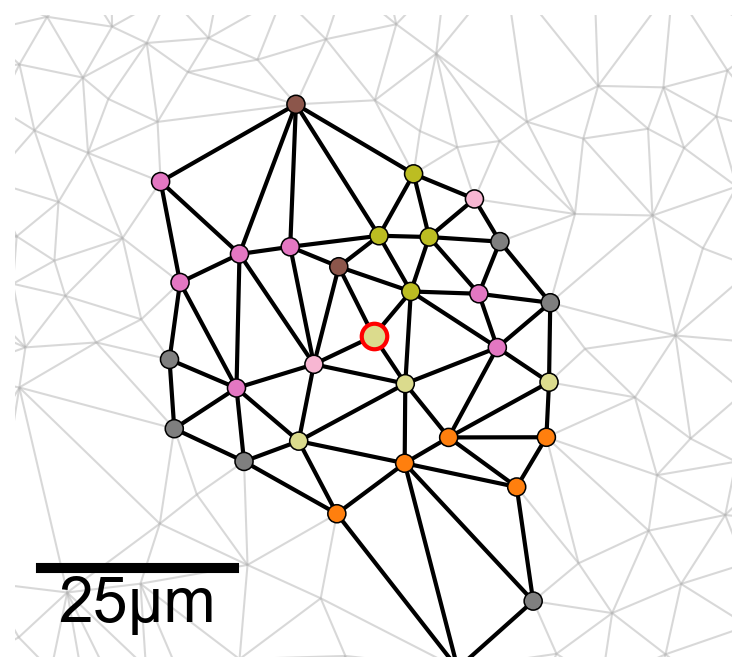

In [16]:
# Define the cell ID to plot
CELL_ID_TO_PLOT = 'molpigdm-1'

# Retrieve the index of the cell to plot based on the cell ID
index_me_plot = ms.query.return_object_IDs_from_query_like(
    domain_4, 
    ms.query.query(domain_4, ('label', 'Cell ID'), 'is', CELL_ID_TO_PLOT)
)[0]

# Generate k-hop neighborhoods for the specified cell
khop_neighbourhoods_prox = ms.networks.khop_neighbourhood(
    domain_4, 
    network_name='centroid_delaunay', 
    source_objects=[index_me_plot], 
    k=3
)

# Extract the indices of the neighborhood cells
me_indices = khop_neighbourhoods_prox[index_me_plot]

# Get the positions of all objects in the domain
object_positions = {v: domain_4.objects[v].centroid for v in list(domain_4.objects.keys())}

# Plot the inset
fig, ax = plt.subplots(figsize=(5.5, 5), nrows=1, ncols=1)

# Visualize the domain with the neighborhood cells highlighted
ms.visualise.visualise(
    domain_4, 
    color_by=('label', 'Cluster ID'), 
    objects_to_plot=np.array(khop_neighbourhoods_prox[index_me_plot]), 
    show_boundary=False, 
    marker_size=50, 
    add_cbar=False, 
    ax=ax,
    shape_kwargs=dict(alpha=0.7, linewidth=0.75), 
    scatter_kwargs=dict(linewidth=0.75, edgecolor='black')
)

# Highlight the neighborhood cells
ms.visualise.visualise(
    domain_4, 
    color_by=('label', 'Cluster ID'), 
    objects_to_plot=me_indices, 
    show_boundary=False, 
    marker_size=75, 
    add_cbar=False, 
    ax=ax,
    shape_kwargs=dict(alpha=0.7, linewidth=0.75), 
    scatter_kwargs=dict(linewidth=0.75, edgecolor='black')
)

# Highlight the central cell
ms.visualise.visualise(
    domain_4, 
    color_by=('label', 'Cluster ID'), 
    objects_to_plot=[index_me_plot], 
    show_boundary=False, 
    marker_size=150, 
    add_cbar=False, 
    ax=ax,
    shape_kwargs=dict(alpha=0.7, linewidth=0.75), 
    scatter_kwargs=dict(linewidth=2, edgecolor='red'),
    add_scalebar=True,
    scalebar_kwargs=dict(
        size=25, 
        label='25µm', 
        loc='lower left', 
        pad=0.25, 
        color='black', 
        zorder=100, 
        size_vertical=1, 
        frameon=False, 
        fontproperties=fm.FontProperties(size=30)
    )
)

# Extract the subgraph for the neighborhood
subG = G.subgraph(khop_neighbourhoods_prox[index_me_plot])

# Get the list of edges in the subgraph
edge_list_me = list(subG.edges())

# Draw the edges of the entire network in light gray
collection_0 = nx.draw_networkx_edges(
    domain_4.networks['centroid_delaunay'], 
    object_positions, 
    edge_color=[0.7, 0.7, 0.7, 0.5], 
    width=1, 
    ax=ax, 
    arrows=False
)

# Draw the edges of the neighborhood in black
collection = nx.draw_networkx_edges(
    domain_4.networks['centroid_delaunay'], 
    object_positions, 
    edgelist=edge_list_me, 
    edge_color=[0, 0, 0, 1], 
    width=2, 
    ax=ax, 
    arrows=False
)

# Set the z-order for the edge collections
collection.set_zorder(20)
collection_0.set_zorder(19)

# Define the center point and region to plot
centrePoint = object_positions[index_me_plot]
region_about_centre = 40

# Set the axis limits and aspect ratio
ax.axis('off')
ax.set_ylim(centrePoint[1] - region_about_centre, centrePoint[1] + region_about_centre)
ax.set_xlim(centrePoint[0] - region_about_centre, centrePoint[0] + region_about_centre)
ax.set_aspect('equal')

Making ME regions into shapes

In [17]:
# Query the domain to get the IDs of objects with 'ME ID' label equal to 0
qME_0_ids = ms.query.interpret_query(
    ms.query.query(domain_4, ('label', 'ME ID'), 'is', 0)
)

# Convert the queried objects into shapes using the alpha shape method
# The alpha parameter controls the shape's detail level, and internal_boundaries is set to True
new_IDs = domain_4.convert_objects(
    population=qME_0_ids,
    collection_name='ME 0',
    return_IDs=True,
    object_type='shape',
    conversion_method='alpha shape',
    conversion_method_kwargs=dict(alpha=20, internal_boundaries=True)
)

In [18]:
# Query the domain to get the IDs of objects with 'ME ID' label equal to 1
qME_1_ids = ms.query.interpret_query(
    ms.query.query(domain_4, ('label', 'ME ID'), 'is', 1)
)

# Convert the queried objects into shapes using the alpha shape method
# The alpha parameter controls the shape's detail level, and internal_boundaries is set to True
new_IDs = domain_4.convert_objects(
    population=qME_1_ids,
    collection_name='ME 1',
    return_IDs=True,
    object_type='shape',
    conversion_method='alpha shape',
    conversion_method_kwargs=dict(alpha=20, internal_boundaries=True)
)

In [19]:
# Query the domain to get the IDs of objects with 'ME ID' label equal to 2
qME_2_ids = ms.query.interpret_query(
    ms.query.query(domain_4, ('label', 'ME ID'), 'is', 2)
)

# Convert the queried objects into shapes using the alpha shape method
# The alpha parameter controls the shape's detail level
# Setting internal_boundaries to False
new_IDs = domain_4.convert_objects(
    population=qME_2_ids,
    collection_name='ME 2',
    return_IDs=True,
    object_type='shape',
    conversion_method='alpha shape',
    conversion_method_kwargs=dict(alpha=20, internal_boundaries=False)
)

In [20]:
# Query the domain to get the IDs of objects with 'ME ID' label equal to 3
qME_3_ids = ms.query.interpret_query(
    ms.query.query(domain_4, ('label', 'ME ID'), 'is', 3)
)

# Convert the queried objects into shapes using the alpha shape method
# The alpha parameter controls the shape's detail level, and internal_boundaries is set to True
new_IDs = domain_4.convert_objects(
    population=qME_3_ids,
    collection_name='ME 3',
    return_IDs=True,
    object_type='shape',
    conversion_method='alpha shape',
    conversion_method_kwargs=dict(alpha=20, internal_boundaries=True)
)

In [21]:
# Query the domain to get the IDs of objects with 'ME ID' label equal to 4
qME_4_ids = ms.query.interpret_query(
    ms.query.query(domain_4, ('label', 'ME ID'), 'is', 4)
)

# Convert the queried objects into shapes using the alpha shape method
# The alpha parameter controls the shape's detail level, and internal_boundaries is set to True
new_IDs = domain_4.convert_objects(
    population=qME_4_ids,
    collection_name='ME 4',
    return_IDs=True,
    object_type='shape',
    conversion_method='alpha shape',
    conversion_method_kwargs=dict(alpha=20, internal_boundaries=True)
)

Note 3: Simplifying shapes can take some time (~3min on M2 chip). We simplify to make shape distances more efficient

In [22]:
# Define a list of microenvironment (ME) regions
ME_list = ['ME 0', 'ME 1', 'ME 2', 'ME 3', 'ME 4']

# Iterate over each ME region
for i, me in enumerate(ME_list):
    # Query the domain to get the shapes corresponding to the current ME region
    qMEshapes = ms.query.query(domain_4, ('collection',), 'is', me)
    
    # Simplify the boundaries of the shapes using the Visvalingam-Whyatt algorithm
    # The epsilon parameter controls the level of simplification
    domain_4.simplify_shape_boundaries(qMEshapes, delete_original_boundary=True, algorithm='Visvalingam-Whyatt', epsilon=50)
    
    # Re-query the domain to get the updated shapes after simplification
    qMEshapes = ms.query.interpret_query(ms.query.query(domain_4, ('collection',), 'is', me))
    
    # Add a new label 'shape ME ID' to the simplified shapes
    # The label is categorical and uses the 'Dark2' colormap
    domain_4.add_labels(label_name='shape ME ID', labels=[i] * len(qMEshapes), add_labels_to=qMEshapes, label_type='categorical', cmap='Dark2')

(12.0549783707, 7234.4599609375)

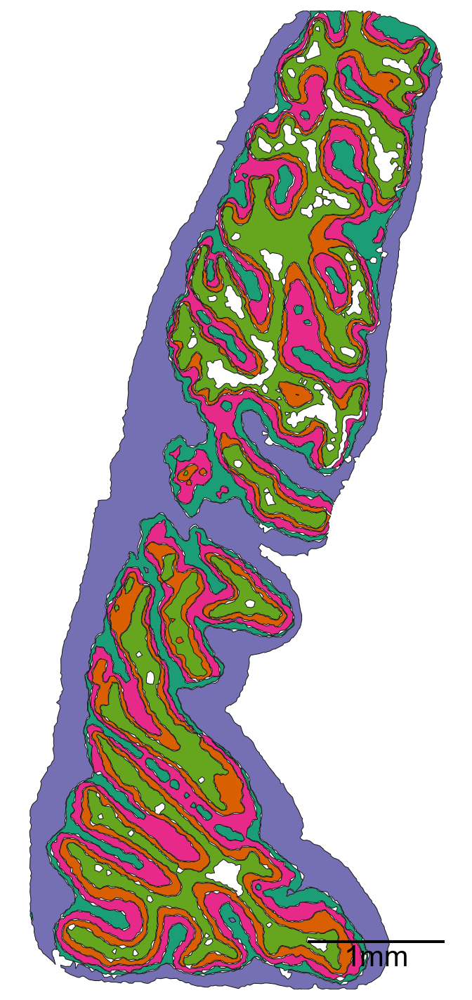

In [23]:
# Query all shapes in the specified microenvironment (ME) regions
qMEshapes_all = ms.query.query(domain_4, ('collection',), 'in', ME_list)

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(5, 10), nrows=1, ncols=1)

# Visualize the domain with the queried shapes
ms.visualise.visualise(
    domain_4,
    marker_size=0.7,
    objects_to_plot=qMEshapes_all,
    ax=ax,
    add_cbar=False,
    color_by=('label', 'shape ME ID'),
    shape_kwargs={'alpha': 1, 'linewidth': 0.5},
    add_scalebar=True,
    scalebar_kwargs=dict(
        size=1000, 
        label='1mm', 
        loc='lower right', 
        pad=0.5, 
        color='black', 
        frameon=False, 
        size_vertical=10, 
        fontproperties=fm.FontProperties(size=20), 
        zorder=100
    )
)

# Set the x and y limits of the plot to the bounding box of the domain
ax.set_xlim(domain_4.bounding_box[0, 0], domain_4.bounding_box[1, 0])
ax.set_ylim(domain_4.bounding_box[0, 1], domain_4.bounding_box[1, 1])


Note 4: distances with shapes can take some time (~5min on a M2 chip)

In [24]:
# Query all shapes in the specified microenvironment (ME) regions
qMEshapes_all = ms.query.query(domain_4, ('collection',), 'in', ['ME 0', 'ME 3', 'ME 2', 'ME 1', 'ME 4'])

# Generate a network using the Proximity method
# The network is created with shapes as nodes and edges based on proximity
ME_graph = ms.networks.generate_network(
    domain_4,
    network_name='ME_shape',
    objects_as_nodes=qMEshapes_all,
    network_type='Proximity',
    distance_weighted=True,
    min_edge_distance=0,
    max_edge_distance=3
)

In [25]:
# Perform adjacency permutation test to assess the significance of network adjacency
# SES_net: Standardized effect size network
# A_net: Adjacency matrix
# unique_labels_net: Unique labels in the network

SES_net, A_net, unique_labels_net = ms.networks.adjacency_permutation_test(
    domain_4,
    network_name='ME_shape',  # Name of the network to use
    label_name='shape ME ID',  # Label to use for adjacency
    adjacency_order=1,  # Order of adjacency to consider
    label_shuffle_iterations=1000,  # Number of label shuffling iterations
    alpha=0.05,  # Significance level
    transform_counts='sqrt',  # Transformation to apply to counts
    observation_threshold=0  # Threshold for observations
)

[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4')]

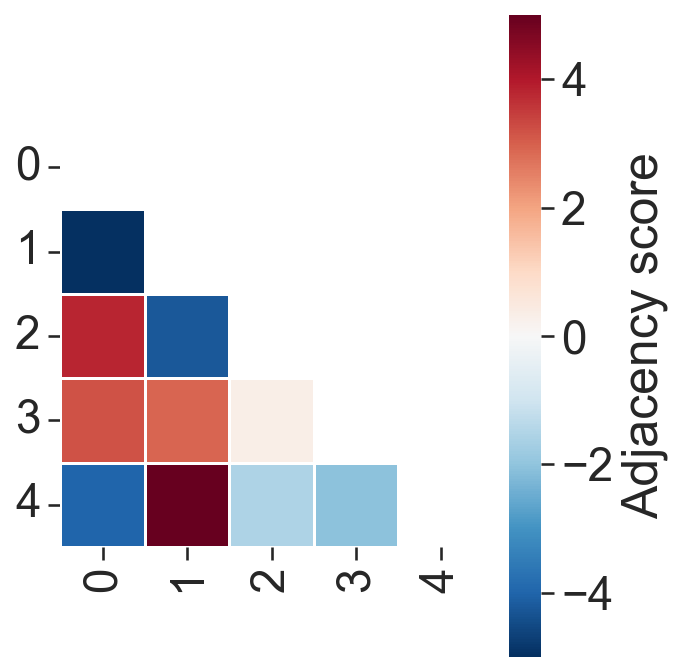

In [29]:
# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(5, 5), nrows=1, ncols=1)

# Visualize the correlation matrix using the SES_net and unique_labels_net
# The correlation matrix is plotted with a lower triangle, using the 'RdBu_r' colormap
# The colorbar limits are set to [-5, 5] and labeled as 'Adjacency score'
ms.visualise.visualise_correlation_matrix(
    SES_net, 
    unique_labels_net, 
    triangle_to_plot='lower', 
    cmap='RdBu_r', 
    colorbar_limit=[-5, 5], 
    ax=ax, 
    colorbar_label='Adjacency score'
)

# Set the x and y tick labels to the unique labels in the network
ax.set_xticklabels(unique_labels_net)
ax.set_yticklabels(unique_labels_net)

### Hotspot analysis

In [30]:
# Generate a hexagonal grid for spatial analysis
# This grid will be used to analyze the spatial distribution of clusters within the domain

# Parameters:
# - domain_4: The domain object containing the spatial data
# - side_length: The side length of each hexagon in the grid
# - regions_collection_name: The name of the collection to store the hexagonal regions
# - label_observations: The labels to observe within each hexagonal region
# - region_include_method: The method to include regions (e.g., 'partial' to include partially overlapping regions)

ms.region_based.generate_hexgrid(
    domain_4,
    side_length=100,
    regions_collection_name='Hexgrids 100',
    label_observations=['Cluster ID'],
    region_include_method='partial'
)

(<Figure size 3000x1500 with 6 Axes>, <Axes: >)

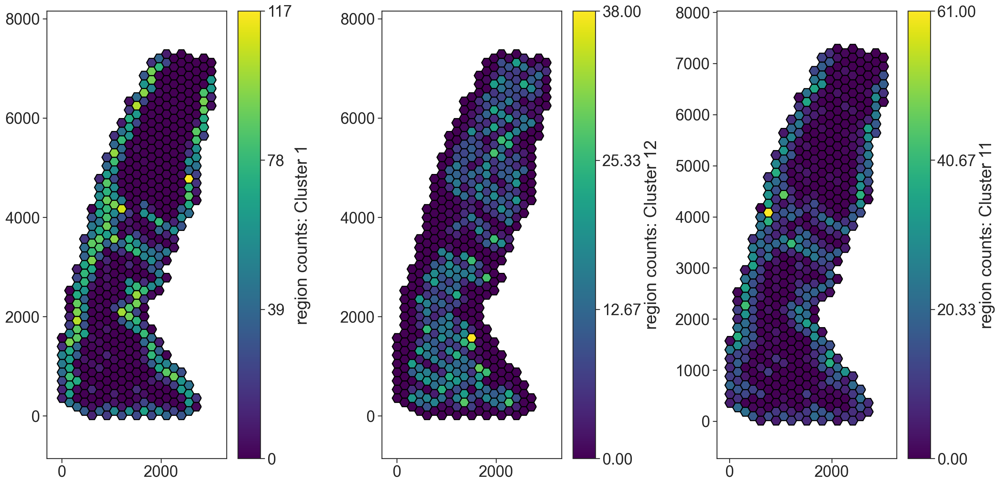

In [36]:
# Visualize the spatial distribution of clusters within the hexagonal grid

# Create a figure with 3 subplots
fig, ax = plt.subplots(1, 3, figsize=(20, 10))

# Plot the hexagonal grid colored by the count of 'Cluster 1'
ms.visualise.visualise(
    domain_4,
    color_by=('label', 'region counts: Cluster 1'),  # Color by the count of 'Cluster 1'
    objects_to_plot=('collection', 'Hexgrids 100'),  # Plot the hexagonal grid
    marker_size=5,  # Set marker size
    ax=ax[0],  # Use the first subplot
    shape_kwargs=dict(alpha=1, linewidth=1.5, edgecolor='black'),  # Shape settings
    add_cbar=True  # Do not add color bar
)

# Plot the hexagonal grid colored by the count of 'Cluster 12'
ms.visualise.visualise(
    domain_4,
    color_by=('label', 'region counts: Cluster 12'),  # Color by the count of 'Cluster 12'
    objects_to_plot=('collection', 'Hexgrids 100'),  # Plot the hexagonal grid
    marker_size=5,  # Set marker size
    ax=ax[1],  # Use the second subplot
    shape_kwargs=dict(alpha=1, linewidth=1.5, edgecolor='black'),  # Shape settings
    add_cbar=True  # Do not add color bar
)

# Plot the hexagonal grid colored by the count of 'Cluster 11'
ms.visualise.visualise(
    domain_4,
    color_by=('label', 'region counts: Cluster 11'),  # Color by the count of 'Cluster 11'
    objects_to_plot=('collection', 'Hexgrids 100'),  # Plot the hexagonal grid
    marker_size=5,  # Set marker size
    ax=ax[2],  # Use the third subplot
    shape_kwargs=dict(alpha=1, linewidth=1.5, edgecolor='black'),  # Shape settings
    add_cbar=True  # Do not add color bar
)


In [40]:
# Perform Getis-Ord Gi* hotspot analysis
# This analysis identifies spatial clusters of high or low values for 'Cluster 2' within the hexagonal grid

# Parameters:
# - domain_4: The domain object containing the spatial data
# - population: The population of objects to analyze ('Hexgrids 100')
# - label_name: The label to analyze ('region counts: Cluster 2')
# - include_boundaries: Boundaries to include in the analysis (None)
# - exclude_boundaries: Boundaries to exclude from the analysis (None)
# - boundary_exclude_distance: Distance to exclude around boundaries (0)
# - distance_weight_function: Function to weight distances (None)
# - network_kwargs: Additional arguments for network generation
# - add_local_value_as_label: Whether to add the local Getis-Ord Gi* value as a label (True)
# - local_getis_label_name: Name of the label for the local Getis-Ord Gi* value ('Local Getis Ord G*: Celltype 2')

local_getis_ord_zscore, _, object_indices = ms.spatial_statistics.getis_ord(
    domain_4,
    population=('Collection', 'Hexgrids 100'),
    label_name='region counts: Cluster 2',
    include_boundaries=None,
    exclude_boundaries=None,
    boundary_exclude_distance=0,
    distance_weight_function=None,
    network_kwargs={
        'network_type': 'Delaunay',
        'min_edge_distance': 0,
        'max_edge_distance': 200
    },
    add_local_value_as_label=True,
    local_getis_label_name='Local Getis Ord G*: Celltype 2'
)

(<Figure size 1050x1050 with 2 Axes>, <Axes: >)

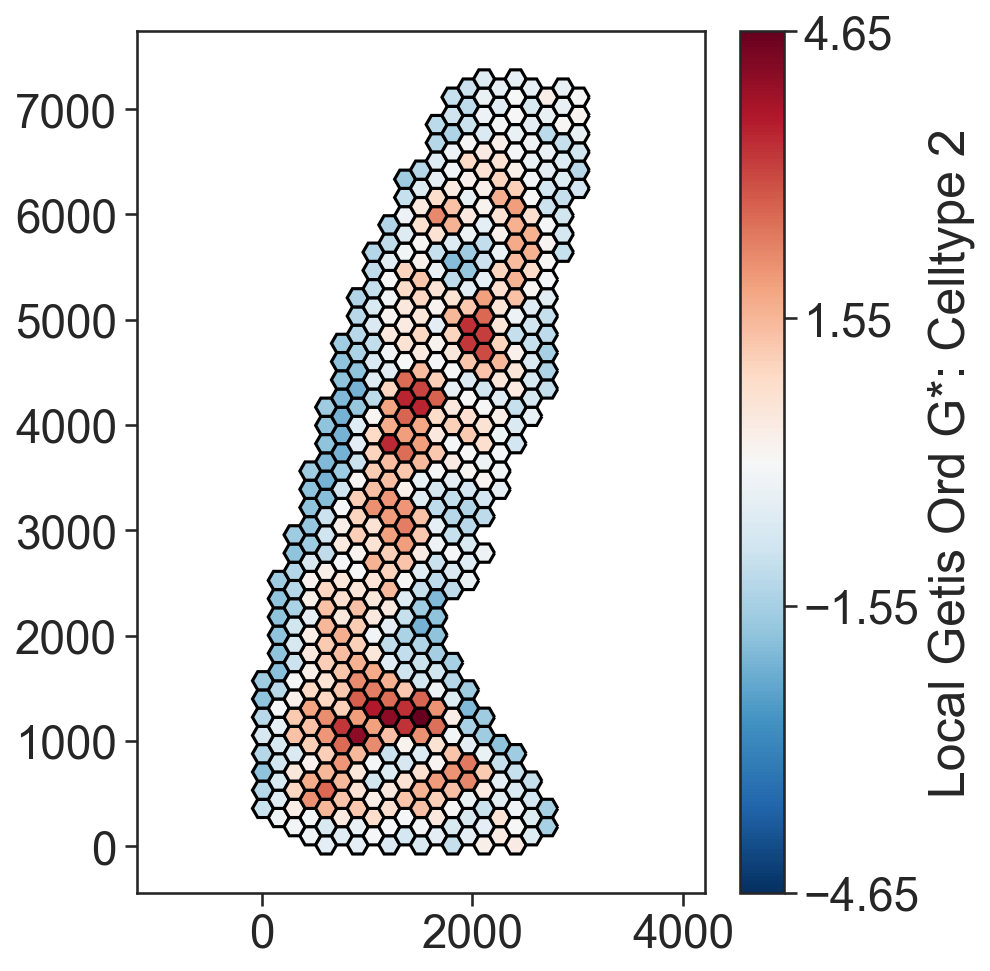

In [44]:
# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(7, 7))

# Visualize the spatial distribution of the Getis-Ord Gi* statistic for 'Cluster 2'
# within the hexagonal grid. The hexagons are colored based on the local Getis-Ord Gi* values.
ms.visualise.visualise(
    domain_4,
    color_by='Local Getis Ord G*: Celltype 2',  # Color by the local Getis-Ord Gi* values for 'Cluster 2'
    objects_to_plot=('collection', 'Hexgrids 100'),  # Plot the hexagonal grid
    marker_size=5,  # Set marker size
    ax=ax,  # Use the created axis
    shape_kwargs=dict(alpha=1, linewidth=1.5, edgecolor='black')  # Shape settings
)


### Continuum analysis

In [45]:
# Estimate the boundary of the domain using the alpha shape method
domain_4.estimate_boundary(method='alpha shape', alpha_shape_kwargs=dict(alpha=30))

# Check if 'Alpha boundary' collection exists and delete it if it does
if 'Alpha boundary' in domain_4.collections:
    qBoundary = ms.query.query(domain_4, ('collection',), 'is', 'Alpha boundary')
    domain_4.delete_objects(qBoundary)

# Query the cell centroids in the domain
qPoints = ms.query.query(domain_4, ('Collection',), 'is', 'Cell centroids')

# Convert the cell centroids into shapes using the alpha shape method
new_IDs = domain_4.convert_objects(
    population=qPoints,
    collection_name='Alpha boundary',
    return_IDs=True,
    object_type='shape',
    conversion_method='alpha shape',
    conversion_method_kwargs=dict(alpha=25, internal_boundaries=False)
)

# Query the newly created 'Alpha boundary' shapes
qBoundary = ms.query.query(domain_4, ('collection',), 'is', 'Alpha boundary')

# Simplify the boundaries of the 'Alpha boundary' shapes using the Visvalingam-Whyatt algorithm
domain_4.simplify_shape_boundaries(
    qBoundary,
    delete_original_boundary=True,
    algorithm='Visvalingam-Whyatt',
    epsilon=1500
)

# Re-estimate the boundary of the domain using the alpha shape method
domain_4.estimate_boundary(method='alpha shape', alpha_shape_kwargs=dict(alpha=30))

# Query the 'Alpha boundary' shapes again
qBoundary = ms.query.query(domain_4, ('collection',), 'is', 'Alpha boundary')

# Query the cell centroids in the domain again
qPoints = ms.query.query(domain_4, ('collection',), 'is', 'Cell centroids')

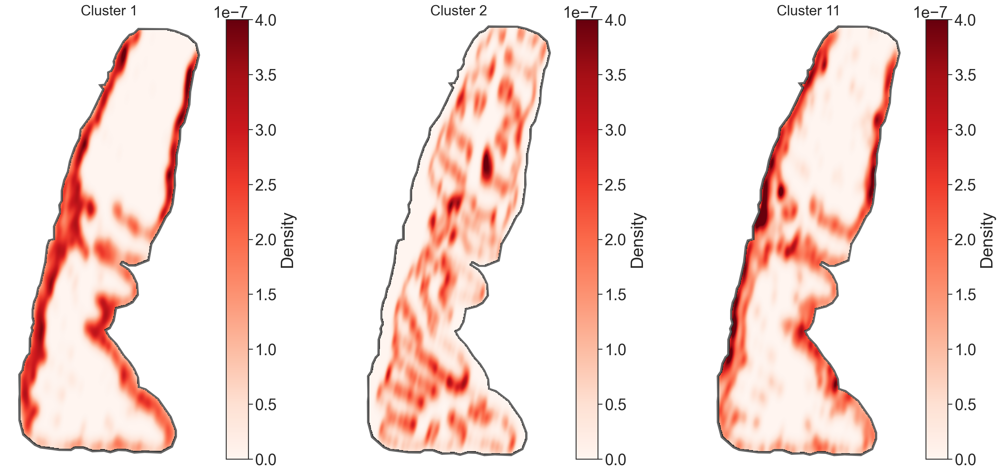

In [47]:
# Define the clusters of interest
clusters_of_interest = ['Cluster 1', 'Cluster 2', 'Cluster 11']

# Create a figure with 3 subplots
fig, ax = plt.subplots(1, 3, figsize=(20, 10))

# Initialize an empty list to store kernel density estimation (KDE) maps
kde_maps = []

# Iterate over each cluster of interest
for i, id in enumerate(clusters_of_interest):
    # Query the domain to get the objects with the specified cluster ID
    qCluster2 = ms.query.query(domain_4, ('label', 'Cluster ID'), 'is', id)
    
    # Perform kernel density estimation for the queried cluster
    kernel_density_matrix = ms.distribution.kernel_density_estimation(
        domain_4,
        population=qCluster2,
        include_boundaries=qBoundary,
        mesh_step=10,
        bw_method=0.05,
        visualise_output=False
    )
    
    # Append the KDE matrix to the list
    kde_maps.append(kernel_density_matrix)
    
    # Visualize the KDE heatmap
    ms.visualise.visualise_heatmap(
        domain_4,
        kernel_density_matrix,
        ax=ax[i],
        colorbar_limit=[0, 4e-7],
        heatmap_zorder=15,
        visualise_kwargs=dict(show_boundary=True)
    )
    
    # Overlay the domain boundary on the heatmap
    ms.visualise.visualise(
        domain_4,
        ax=ax[i],
        add_cbar=False,
        objects_to_plot=qBoundary,
        show_boundary=False,
        shape_kwargs=dict(facecolor=[0, 0, 0, 1], edgecolor=[0, 0, 0, 1], linewidth=5)
    )
    
    # Customize the subplot appearance
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].axis('off')
    ax[i].set_aspect('equal')
    ax[i].set_title(id, fontsize=20)

In [48]:
# Initialize matrices to store Wasserstein and KL divergence distances
Wass_dist = np.zeros((len(clusters_of_interest), len(clusters_of_interest)))
KL_dist = np.zeros((len(clusters_of_interest), len(clusters_of_interest)))

# Loop through each pair of clusters to compute distances
for i, clusterA in enumerate(clusters_of_interest):
    for j, clusterB in enumerate(clusters_of_interest):
        # Skip computation for the lower triangle and diagonal
        if j <= i:
            continue
        
        # Query the domain for the objects belonging to the current clusters
        qPopA = ms.query.query(domain_4, ('label', 'Cluster ID'), 'is', clusterA)
        qPopB = ms.query.query(domain_4, ('label', 'Cluster ID'), 'is', clusterB)
        
        # Compute the Sliced Wasserstein Distance between the two clusters
        Wass_dist[i, j] = ms.distribution.sliced_wasserstein_distance(
            domain_4, qPopA, qPopB, POT_args={'n_projections': 500, 'seed': 42}
        )
        
        # Compute the KL Divergence between the kernel density estimates of the two clusters
        KL_dist[i, j] = ms.distribution.kl_divergence(kde_maps[i], kde_maps[j])

Text(43.62499999999999, 0.5, 'Celltype ID')

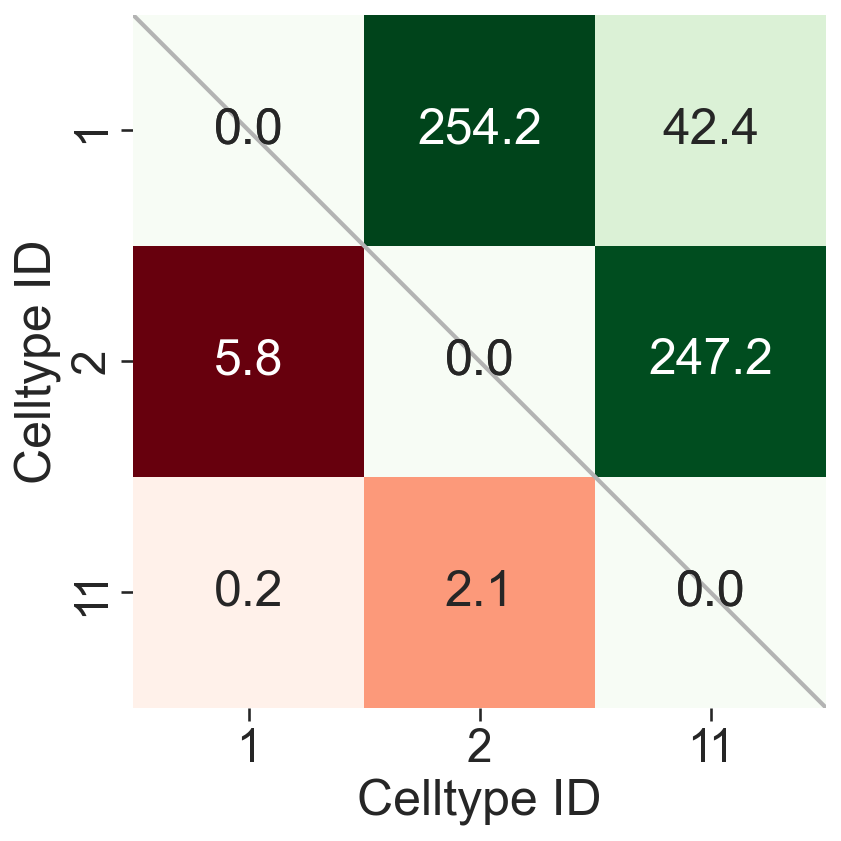

In [49]:
# Extract numeric labels from the cluster names for plotting
numeric_label_categories = [lab[8:] for lab in clusters_of_interest]

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(6, 6))
fig.set_facecolor('none')
fig.patch.set_alpha(0)

# Create masks for the upper triangle of the distance matrices
SES_mask = np.triu(Wass_dist, k=0)
KL_mask = np.triu(KL_dist, k=0)

# Plot a diagonal line for reference
ax.plot([0, len(numeric_label_categories)], [0, len(numeric_label_categories)], linestyle='-', color=[0.7, 0.7, 0.7], linewidth=2)

# Plot the KL divergence heatmap
sns.heatmap(
    KL_dist.T,
    xticklabels=numeric_label_categories,
    yticklabels=numeric_label_categories,
    ax=ax,
    cmap='Reds',
    square=True,
    linewidths=0,
    linecolor='black',
    cbar_kws=dict(use_gridspec=False, location="top", label='KL divergence', pad=0),
    mask=KL_mask,
    annot=True,
    fmt=".1f",
    cbar=False
)

# Plot the Wasserstein distance heatmap
sns.heatmap(
    Wass_dist,
    xticklabels=numeric_label_categories,
    yticklabels=numeric_label_categories,
    ax=ax,
    cmap='Greens',
    square=True,
    linewidths=0,
    linecolor='black',
    cbar_kws=dict(use_gridspec=False, location="top", label='Wasserstein distance', pad=0),
    mask=SES_mask.T,
    annot=True,
    fmt=".1f",
    cbar=False
)

# Set the labels for the axes
ax.set_xlabel('Celltype ID')
ax.set_ylabel('Celltype ID')